In [1]:
import sys

if 'ipykernel_launcher' in sys.argv[0]:
    sys.argv = [sys.argv[0]]

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm
from src.models import *
from src.constants import *
from src.plotting import *
from src.pot import pot_eval
from src.utils import *
from src.diagnosis import *
from src.merlin import *
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torch.nn as nn
from time import time
from pprint import pprint
import seaborn as sns
import mlflow

import warnings
warnings.filterwarnings('ignore')

Using backend: pytorch


### Importing data

In [3]:
columns = [
    'data:zone_air_heating_temperature_setpoint', 
    'data:zone_air_temperature_sensor', 
    'data:zone_air_cooling_temperature_setpoint', 
    'data:supply_air_flowrate_sensor', 
    'data:supply_air_damper_percentage_command', 
    'data:supply_air_flowrate_setpoint', 
    'dow',
    'hod',
    'class_label']

df = pd.read_csv('data/anomaly_detection_sample_1577622599.csv', usecols=columns)

new_column_names = [
    'heating_setpoint', 
    'air_temperature', 
    'cooling_setpoint', 
    'supply_flowrate', 
    'damper_percentage', 
    'flowrate_setpoint', 
    'day_of_week', 
    'hour_of_day', 
    'label'
]

df.columns = new_column_names

df['label'] = df['label'].replace({0: 1, 1: 0})

df.head()

,heating_setpoint,air_temperature,cooling_setpoint,supply_flowrate,damper_percentage,flowrate_setpoint,day_of_week,hour_of_day,label
0,294.259259,296.037037,297.037037,0.044528,47.265250,0.037756,0,17,0
1,294.259259,294.925926,297.037037,0.203740,4.489845,0.188779,0,17,0
2,294.259259,296.648148,297.037037,0.036790,20.409615,0.035396,0,17,0
3,294.259259,296.425926,297.037037,0.154288,37.755330,0.151023,0,17,0
4,294.259259,296.092593,297.037037,0.178737,16.167740,0.169901,0,17,0


### Data Preparation

In [4]:
X = df.drop(['day_of_week', 'hour_of_day', 'label'], axis=1)
# X = df.drop(['label'], axis=1)
y = df['label']

X_train, X_test, y_test = X.iloc[:27113, :], X.iloc[27113:, :], y.iloc[27113:]

X_train = X_train.values
X_test = X_test.values

### Sample data (First day: train, second day: test)
steps_per_day = X_test.shape[0] // 7 

sample_train = X_test[:steps_per_day]
sample_test = X_test[steps_per_day:steps_per_day*2]

def normalize(a, min_a = None, max_a = None):
	if min_a is None: min_a, max_a = np.min(a, axis = 0), np.max(a, axis = 0)
	return (a - min_a) / (max_a - min_a + 0.0001), min_a, max_a

train, min_a, max_a = normalize(sample_train)
test, _, _ = normalize(sample_test, min_a, max_a)

labels = np.repeat(y_test[:, np.newaxis], repeats=test.shape[1], axis=1)
labels = labels.astype(float)

labels = labels[steps_per_day:steps_per_day*2]

In [5]:
train.shape, test.shape, labels.shape

((4758, 6), (4758, 6), (4758, 6))

### Functions

In [6]:
### Windows functions
def convert_to_windows(data, model):
	windows = []; w_size = model.n_window
	for i, g in enumerate(data): 
		if i >= w_size: w = data[i-w_size:i]
		else: w = torch.cat([data[0].repeat(w_size-i, 1), data[0:i]])
		windows.append(w)
	return torch.stack(windows)

### Dataloader
def data_loader(train, test, labels):
	train_loader = DataLoader(train, batch_size=train.shape[0])
	test_loader = DataLoader(test, batch_size=test.shape[0])
	labels_loader = labels
	return train_loader, test_loader, labels_loader

### Model
def create_model(modelname, dims):
	import src.models
	model_class = getattr(src.models, modelname)
	model = model_class(dims).double()

	optimizer = torch.optim.AdamW(model.parameters() , lr=model.lr, weight_decay=1e-5)
	scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 5, 0.9)

	print(f"{color.GREEN}Creating new model: {model.name}{color.ENDC}")
	
	epoch = -1
	accuracy_list = []

	return model, optimizer, scheduler, epoch, accuracy_list

### Training
def backprop(epoch, model, data, dataO, optimizer, scheduler, training = True):
    feats = dataO.shape[1]
    l = nn.MSELoss(reduction = 'none')
    
    data_x = torch.DoubleTensor(data); dataset = TensorDataset(data_x, data_x)
    bs = model.batch if training else len(data)
    dataloader = DataLoader(dataset, batch_size = bs)
    n = epoch + 1; w_size = model.n_window
    l1s, l2s = [], []
    if training:
        for d, _ in dataloader:
            local_bs = d.shape[0]
            window = d.permute(1, 0, 2)
            elem = window[-1, :, :].view(1, local_bs, feats)
            z = model(window, elem)
            l1 = l(z, elem) if not isinstance(z, tuple) else (1 / n) * l(z[0], elem) + (1 - 1/n) * l(z[1], elem)
            if isinstance(z, tuple): z = z[1]
            l1s.append(torch.mean(l1).item())
            loss = torch.mean(l1)
            optimizer.zero_grad()
            loss.backward(retain_graph=True)
            optimizer.step()
        scheduler.step()
        tqdm.write(f'Epoch {epoch},\tL1 = {np.mean(l1s)}')
        return np.mean(l1s), optimizer.param_groups[0]['lr']
    else:
        for d, _ in dataloader:
            window = d.permute(1, 0, 2)
            elem = window[-1, :, :].view(1, bs, feats)
            z = model(window, elem)
            if isinstance(z, tuple): z = z[1]
        loss = l(z, elem)[0]
        return loss.detach().numpy(), z.detach().numpy()[0]

In [7]:
train_loader, test_loader, labels_loader = data_loader(train, test, labels)

model, optimizer, scheduler, epoch, loss_list = create_model('TranAD', labels_loader.shape[1])

## Prepare data
trainD, testD = next(iter(train_loader)), next(iter(test_loader))
trainO, testO = trainD, testD 

trainD, testD = convert_to_windows(trainD, model), convert_to_windows(testD, model)

Creating new model: TranAD


### Experiment Tracking

In [8]:
mlflow.set_tracking_uri("http://localhost:5000")
mlflow.set_experiment("TranAD on Smart building dataset")

<Experiment: artifact_location='mlflow-artifacts:/945510866311899735', creation_time=1723717675457, experiment_id='945510866311899735', last_update_time=1723717675457, lifecycle_stage='active', name='TranAD on Smart building dataset', tags={}>

In [9]:
import gc
gc.collect()

399

  0%|          | 0/100 [00:00<?, ?it/s]

Creating new model: TranAD
Training TranAD on external dataset.


  1%|          | 1/100 [00:01<01:55,  1.17s/it]

Epoch 0,	L1 = 0.16243421349725026


  2%|▏         | 2/100 [00:02<01:55,  1.18s/it]

Epoch 1,	L1 = 0.1487513315790658


  3%|▎         | 3/100 [00:03<01:52,  1.16s/it]

Epoch 2,	L1 = 0.1384173956018139


  4%|▍         | 4/100 [00:04<01:47,  1.12s/it]

Epoch 3,	L1 = 0.12924779901838732


  5%|▌         | 5/100 [00:05<01:45,  1.11s/it]

Epoch 4,	L1 = 0.12077925171871184


  6%|▌         | 6/100 [00:06<01:43,  1.10s/it]

Epoch 5,	L1 = 0.11378113776917836


  7%|▋         | 7/100 [00:07<01:42,  1.10s/it]

Epoch 6,	L1 = 0.10818600984974562


  8%|▊         | 8/100 [00:08<01:40,  1.09s/it]

Epoch 7,	L1 = 0.10270382487447817


  9%|▉         | 9/100 [00:09<01:39,  1.10s/it]

Epoch 8,	L1 = 0.09770410459004347


 10%|█         | 10/100 [00:11<01:37,  1.09s/it]

Epoch 9,	L1 = 0.09334738023284324


 11%|█         | 11/100 [00:12<01:36,  1.09s/it]

Epoch 10,	L1 = 0.08866261803167969


 12%|█▏        | 12/100 [00:13<01:35,  1.08s/it]

Epoch 11,	L1 = 0.08561530854870632


 13%|█▎        | 13/100 [00:14<01:34,  1.09s/it]

Epoch 12,	L1 = 0.08168657039651814


 14%|█▍        | 14/100 [00:15<01:33,  1.08s/it]

Epoch 13,	L1 = 0.07849892304266715


 15%|█▌        | 15/100 [00:16<01:31,  1.08s/it]

Epoch 14,	L1 = 0.07548666468568714


 16%|█▌        | 16/100 [00:17<01:30,  1.08s/it]

Epoch 15,	L1 = 0.07203749187972637


 17%|█▋        | 17/100 [00:18<01:29,  1.08s/it]

Epoch 16,	L1 = 0.06843544765253419


 18%|█▊        | 18/100 [00:19<01:28,  1.08s/it]

Epoch 17,	L1 = 0.06576057799493872


 19%|█▉        | 19/100 [00:20<01:27,  1.08s/it]

Epoch 18,	L1 = 0.06303958891099119


 20%|██        | 20/100 [00:21<01:25,  1.07s/it]

Epoch 19,	L1 = 0.060808603985270146


 21%|██        | 21/100 [00:22<01:24,  1.07s/it]

Epoch 20,	L1 = 0.05775652758515828


 22%|██▏       | 22/100 [00:23<01:23,  1.08s/it]

Epoch 21,	L1 = 0.05548768535537968


 23%|██▎       | 23/100 [00:25<01:22,  1.07s/it]

Epoch 22,	L1 = 0.05358947948480797


 24%|██▍       | 24/100 [00:26<01:22,  1.08s/it]

Epoch 23,	L1 = 0.05213425102672958


 25%|██▌       | 25/100 [00:27<01:21,  1.08s/it]

Epoch 24,	L1 = 0.049779845304431525


 26%|██▌       | 26/100 [00:28<01:20,  1.09s/it]

Epoch 25,	L1 = 0.04888745375362005


 27%|██▋       | 27/100 [00:29<01:18,  1.08s/it]

Epoch 26,	L1 = 0.047489723951976724


 28%|██▊       | 28/100 [00:30<01:19,  1.10s/it]

Epoch 27,	L1 = 0.04629631899109209


 29%|██▉       | 29/100 [00:31<01:17,  1.09s/it]

Epoch 28,	L1 = 0.04508915637572116


 30%|███       | 30/100 [00:32<01:16,  1.09s/it]

Epoch 29,	L1 = 0.043940683481808955


 31%|███       | 31/100 [00:33<01:14,  1.08s/it]

Epoch 30,	L1 = 0.043185797497450266


 32%|███▏      | 32/100 [00:34<01:14,  1.09s/it]

Epoch 31,	L1 = 0.042144870537643396


 33%|███▎      | 33/100 [00:35<01:12,  1.08s/it]

Epoch 32,	L1 = 0.0419259488135148


 34%|███▍      | 34/100 [00:37<01:11,  1.08s/it]

Epoch 33,	L1 = 0.04120377117158183


 35%|███▌      | 35/100 [00:38<01:10,  1.08s/it]

Epoch 34,	L1 = 0.040567563840418874


 36%|███▌      | 36/100 [00:39<01:09,  1.08s/it]

Epoch 35,	L1 = 0.040341712797280514


 37%|███▋      | 37/100 [00:40<01:08,  1.08s/it]

Epoch 36,	L1 = 0.03940994178357118


 38%|███▊      | 38/100 [00:41<01:07,  1.08s/it]

Epoch 37,	L1 = 0.03894604848062115


 39%|███▉      | 39/100 [00:42<01:05,  1.08s/it]

Epoch 38,	L1 = 0.03866375910851063


 40%|████      | 40/100 [00:43<01:04,  1.08s/it]

Epoch 39,	L1 = 0.03802953562316913


 41%|████      | 41/100 [00:44<01:03,  1.08s/it]

Epoch 40,	L1 = 0.03769052607535843


 42%|████▏     | 42/100 [00:45<01:02,  1.08s/it]

Epoch 41,	L1 = 0.0370189388602211


 43%|████▎     | 43/100 [00:46<01:01,  1.07s/it]

Epoch 42,	L1 = 0.03677146196526383


 44%|████▍     | 44/100 [00:47<00:59,  1.07s/it]

Epoch 43,	L1 = 0.036495302537785566


 45%|████▌     | 45/100 [00:48<00:59,  1.07s/it]

Epoch 44,	L1 = 0.03590482638334852


 46%|████▌     | 46/100 [00:49<00:58,  1.08s/it]

Epoch 45,	L1 = 0.0360671901349424


 47%|████▋     | 47/100 [00:51<00:58,  1.10s/it]

Epoch 46,	L1 = 0.035764789671178285


 48%|████▊     | 48/100 [00:52<00:57,  1.10s/it]

Epoch 47,	L1 = 0.03542253069246824


 49%|████▉     | 49/100 [00:53<00:55,  1.09s/it]

Epoch 48,	L1 = 0.034907768710235786


 50%|█████     | 50/100 [00:54<00:54,  1.08s/it]

Epoch 49,	L1 = 0.03490258809450768


 51%|█████     | 51/100 [00:55<00:52,  1.08s/it]

Epoch 50,	L1 = 0.03452631859356645


 52%|█████▏    | 52/100 [00:56<00:51,  1.08s/it]

Epoch 51,	L1 = 0.034185352727321254


 53%|█████▎    | 53/100 [00:57<00:51,  1.09s/it]

Epoch 52,	L1 = 0.03377992311843639


 54%|█████▍    | 54/100 [00:58<00:49,  1.08s/it]

Epoch 53,	L1 = 0.033490581704552935


 55%|█████▌    | 55/100 [00:59<00:48,  1.08s/it]

Epoch 54,	L1 = 0.03312263062434791


 56%|█████▌    | 56/100 [01:00<00:47,  1.07s/it]

Epoch 55,	L1 = 0.03295862953208726


 57%|█████▋    | 57/100 [01:01<00:46,  1.08s/it]

Epoch 56,	L1 = 0.03322026768063878


 58%|█████▊    | 58/100 [01:02<00:45,  1.07s/it]

Epoch 57,	L1 = 0.032634443437690126


 59%|█████▉    | 59/100 [01:04<00:44,  1.07s/it]

Epoch 58,	L1 = 0.03241703971500728


 60%|██████    | 60/100 [01:05<00:43,  1.08s/it]

Epoch 59,	L1 = 0.03191194807222379


 61%|██████    | 61/100 [01:06<00:42,  1.08s/it]

Epoch 60,	L1 = 0.03213684181581547


 62%|██████▏   | 62/100 [01:07<00:40,  1.08s/it]

Epoch 61,	L1 = 0.03155668104422874


 63%|██████▎   | 63/100 [01:08<00:40,  1.08s/it]

Epoch 62,	L1 = 0.031654155042254405


 64%|██████▍   | 64/100 [01:09<00:38,  1.07s/it]

Epoch 63,	L1 = 0.031116266780475084


 65%|██████▌   | 65/100 [01:10<00:37,  1.07s/it]

Epoch 64,	L1 = 0.031001763915334234


 66%|██████▌   | 66/100 [01:11<00:36,  1.08s/it]

Epoch 65,	L1 = 0.0309696198592563


 67%|██████▋   | 67/100 [01:12<00:35,  1.08s/it]

Epoch 66,	L1 = 0.03076827218232666


 68%|██████▊   | 68/100 [01:13<00:34,  1.07s/it]

Epoch 67,	L1 = 0.030653864217678205


 69%|██████▉   | 69/100 [01:14<00:33,  1.08s/it]

Epoch 68,	L1 = 0.03034084877893248


 70%|███████   | 70/100 [01:15<00:32,  1.08s/it]

Epoch 69,	L1 = 0.029964062898251938


 71%|███████   | 71/100 [01:16<00:31,  1.08s/it]

Epoch 70,	L1 = 0.02983297482512876


 72%|███████▏  | 72/100 [01:18<00:30,  1.08s/it]

Epoch 71,	L1 = 0.029700244042088108


 73%|███████▎  | 73/100 [01:19<00:31,  1.18s/it]

Epoch 72,	L1 = 0.02928092217144447


 74%|███████▍  | 74/100 [01:20<00:32,  1.24s/it]

Epoch 73,	L1 = 0.029198699088383514


 75%|███████▌  | 75/100 [01:22<00:32,  1.29s/it]

Epoch 74,	L1 = 0.02934559624519087


 76%|███████▌  | 76/100 [01:23<00:31,  1.31s/it]

Epoch 75,	L1 = 0.029070478114986045


 77%|███████▋  | 77/100 [01:24<00:29,  1.27s/it]

Epoch 76,	L1 = 0.02875111797685466


 78%|███████▊  | 78/100 [01:26<00:28,  1.29s/it]

Epoch 77,	L1 = 0.028765111175149075


 79%|███████▉  | 79/100 [01:27<00:27,  1.29s/it]

Epoch 78,	L1 = 0.02867165983319031


 80%|████████  | 80/100 [01:28<00:26,  1.31s/it]

Epoch 79,	L1 = 0.02826113050783116


 81%|████████  | 81/100 [01:29<00:23,  1.25s/it]

Epoch 80,	L1 = 0.02821810542110617


 82%|████████▏ | 82/100 [01:30<00:21,  1.22s/it]

Epoch 81,	L1 = 0.028196819157873764


 83%|████████▎ | 83/100 [01:32<00:20,  1.23s/it]

Epoch 82,	L1 = 0.027772617529149085


 84%|████████▍ | 84/100 [01:33<00:19,  1.24s/it]

Epoch 83,	L1 = 0.027596516927837975


 85%|████████▌ | 85/100 [01:34<00:18,  1.24s/it]

Epoch 84,	L1 = 0.02732795744802518


 86%|████████▌ | 86/100 [01:35<00:17,  1.24s/it]

Epoch 85,	L1 = 0.02748985103693724


 87%|████████▋ | 87/100 [01:37<00:16,  1.23s/it]

Epoch 86,	L1 = 0.027311745518296925


 88%|████████▊ | 88/100 [01:38<00:15,  1.25s/it]

Epoch 87,	L1 = 0.027203823609010816


 89%|████████▉ | 89/100 [01:39<00:13,  1.27s/it]

Epoch 88,	L1 = 0.027211794952372404


 90%|█████████ | 90/100 [01:41<00:12,  1.28s/it]

Epoch 89,	L1 = 0.026714442564117983


 91%|█████████ | 91/100 [01:42<00:11,  1.29s/it]

Epoch 90,	L1 = 0.02688352565350185


 92%|█████████▏| 92/100 [01:43<00:09,  1.24s/it]

Epoch 91,	L1 = 0.026328352086892354


 93%|█████████▎| 93/100 [01:44<00:08,  1.22s/it]

Epoch 92,	L1 = 0.026671398214544808


 94%|█████████▍| 94/100 [01:45<00:07,  1.18s/it]

Epoch 93,	L1 = 0.025971246604448994


 95%|█████████▌| 95/100 [01:47<00:05,  1.18s/it]

Epoch 94,	L1 = 0.02627112867442834


 96%|█████████▌| 96/100 [01:48<00:04,  1.21s/it]

Epoch 95,	L1 = 0.02617574729917917


 97%|█████████▋| 97/100 [01:49<00:03,  1.20s/it]

Epoch 96,	L1 = 0.026206305861902132


 98%|█████████▊| 98/100 [01:50<00:02,  1.24s/it]

Epoch 97,	L1 = 0.025915668047786795


 99%|█████████▉| 99/100 [01:52<00:01,  1.28s/it]

Epoch 98,	L1 = 0.025712157306193043


100%|██████████| 100/100 [01:53<00:00,  1.14s/it]


Epoch 99,	L1 = 0.025913440798351523
Training time:   113.8127 s


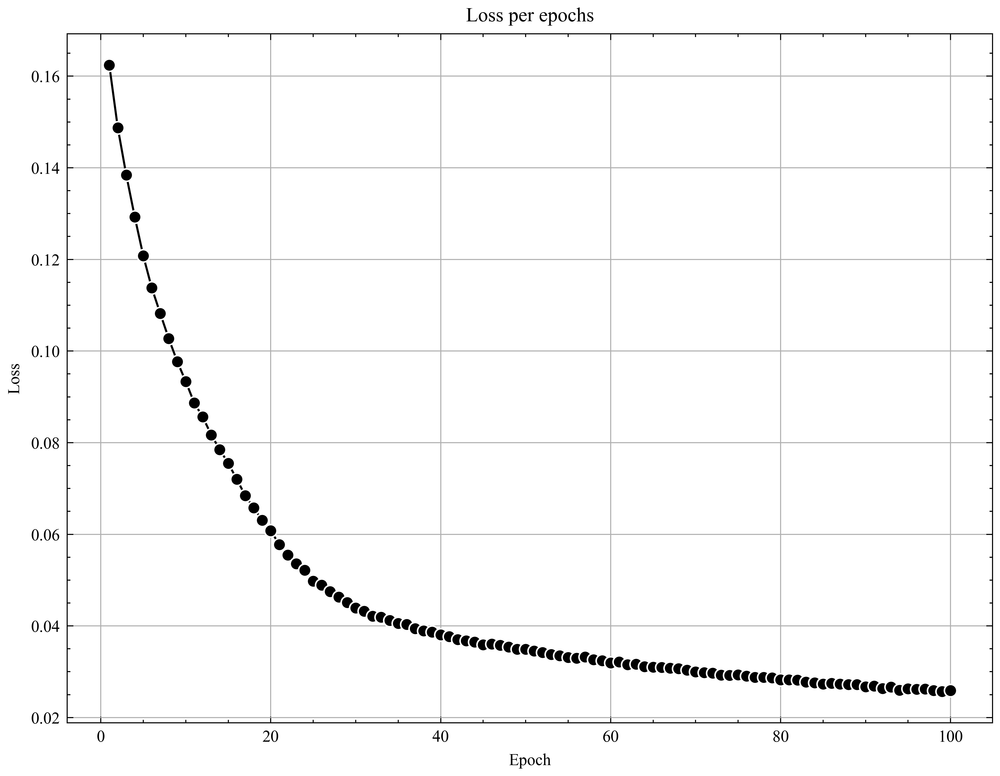

Testing TranAD on SBD dataset


,FN,FP,ROC/AUC,TN,TP,f1,precision,recall,threshold
0,255.0,0.0,0.500000,4503.0,0.0,0.00000,0.000,0.000000,0.481107
1,241.0,98.0,0.516569,4405.0,14.0,0.07629,0.125,0.054902,0.113487
2,255.0,241.0,0.473240,4262.0,0.0,0.00000,0.000,0.000000,0.090139
3,255.0,4.0,0.499556,4499.0,0.0,0.00000,0.000,0.000000,0.089633
4,255.0,53.0,0.494115,4450.0,0.0,0.00000,0.000,0.000000,0.211248
5,255.0,0.0,0.500000,4503.0,0.0,0.00000,0.000,0.000000,0.256460


{'f1': 0.0, 'precision': 0.0, 'recall': 0.0, 'TP': 0, 'TN': 4463, 'FP': 40, 'FN': 255, 'ROC/AUC': 0.4955585165445259, 'threshold': 0.09239361272576695, 'Hit@100%': 1.0, 'Hit@150%': 1.0, 'NDCG@100%': 1.0, 'NDCG@150%': 1.0}


2024/08/16 09:49:04 INFO mlflow.tracking._tracking_service.client: 🏃 View run 12_increasing_epoch at: http://localhost:5000/#/experiments/945510866311899735/runs/e786d883a2f644f1b5f9898df6e999dc.
2024/08/16 09:49:04 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://localhost:5000/#/experiments/945510866311899735.


In [10]:
RUN_NAME = '12_increasing_epoch'

with mlflow.start_run(run_name=RUN_NAME):
    ### Hyperparameters
    params = {
        'lr': 0.0001,
        'batch_size': 128,
        'epochs': 100,
        'window_size': 10,
        'lm': (0.989, 1.03)
    }

    model, optimizer, scheduler, epoch, loss_list = create_model('TranAD', labels_loader.shape[1])

    ### Training phase
    print(f'{color.HEADER}Training TranAD on external dataset.{color.ENDC}')
    num_epochs = params['epochs']; e = epoch + 1; start = time()
    for e in tqdm(list(range(epoch+1, epoch+num_epochs+1))):
        lossT, lr = backprop(e, model, trainD, trainO, optimizer, scheduler)
        loss_list.append((lossT, lr))
    print(color.BOLD+'Training time: '+"{:10.4f}".format(time()-start)+' s'+color.ENDC)

    mlflow.log_params(params)

    ### Training loss plot
    epochs = list(range(1, len(loss_list) + 1))
    loss = [l[0] for l in loss_list]

    plt.figure(figsize=(8, 6))
    sns.lineplot(x=epochs, y=loss, marker='o')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss per epochs')
    plt.grid(True)

    mlflow.log_figure(plt.gcf(), "training loss.png")

    plt.show()

    ### Testing phase
    torch.zero_grad = True
    model.eval()
    preds = []
    print(f'{color.HEADER}Testing TranAD on SBD dataset{color.ENDC}')
    loss, y_pred = backprop(0, model, testD, testO, optimizer, scheduler, training=False)

    df = pd.DataFrame()
    lossT, _ = backprop(0, model, trainD, trainO, optimizer, scheduler, training=False)
    for i in range(loss.shape[1]):
        lt, l, ls = lossT[:, i], loss[:, i], labels_loader[:, i]
        result, pred = pot_eval(lt, l, ls) 
        preds.append(pred)
        df = df.append(result, ignore_index=True)

    lossTfinal, lossFinal = np.mean(lossT, axis=1), np.mean(loss, axis=1)
    labelsFinal = (np.sum(labels_loader, axis=1) >= 1) + 0
    result, _ = pot_eval(lossTfinal, lossFinal, labelsFinal)
    result.update(hit_att(loss, labels_loader))
    result.update(ndcg(loss, labels_loader))
    display(df)
    print(result)

    mlflow.log_metric("AUC", result['ROC/AUC'])
    mlflow.log_metric("Precision", result['precision'])
    mlflow.log_metric("Recall", result['recall'])
    mlflow.log_metric("F1", result['f1'])
    mlflow.log_metric("Threshold", result['threshold'])

    ### Results plot
    final_preds = np.array([[np.float32(value) for value in sublist] for sublist in preds]).T

    test_data = test
    true_labels = labels
    predicted_labels = final_preds

    channels = np.arange(0, 6)
    channel_len = len(channels)

    # Plotting
    fig, axes = plt.subplots(channel_len*2, 1, figsize=(15, channel_len*4), sharex=True)
    time_steps = np.arange(test_data.shape[0])

    for i, axes_i in enumerate(range(0, channel_len*2, 2)):
        channel = channels[i]
        axes[axes_i].plot(time_steps, test_data[:, channel], label='original data')
        axes[axes_i].plot(time_steps, y_pred[:, channel], label='predicted data')
        axes[axes_i].fill_between(time_steps, 0, 1, where=true_labels[:, channel] == 1, color='red', alpha=0.5, label='true anomaly')
        axes[axes_i].set_title(f'Channel {channel}', fontsize=12)
        axes[axes_i].set_xlabel('Time', fontsize=10)
        axes[axes_i].set_ylabel('Value', fontsize=10)
        axes[axes_i].grid(True)
        axes[axes_i].legend()

        axes[axes_i + 1].plot(time_steps, loss[:, channel], color='green', label='anomaly score')
        axes[axes_i + 1].fill_between(time_steps, 0, 1, where=predicted_labels[:, channel] == 1, color='blue', alpha=0.5, label='predicted anomaly')
        axes[axes_i + 1].set_title(f'Channel {channel} - Anomaly Score', fontsize=12)
        axes[axes_i + 1].set_xlabel('Time', fontsize=10)
        axes[axes_i + 1].set_ylabel('Value', fontsize=10)
        axes[axes_i + 1].grid(True)
        axes[axes_i + 1].legend()

    fig.suptitle('Testing data with true anomaly and predicted anomaly', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    mlflow.log_figure(fig, "result.png")